In [1]:
#! pip install wordcloud

In [1]:
#general utilities
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import re
from nltk.tokenize import TweetTokenizer
import nltk
from collections import Counter
import plotly.graph_objects as go
from wordcloud import WordCloud

In [2]:
#tokenization resources
from nltk.stem import WordNetLemmatizer
nltk.download("wordnet")

[nltk_data] Downloading package wordnet to /Users/sarah/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [3]:
#for NMF
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF
from sklearn.manifold import TSNE

In [4]:
#for coherence implementation
from gensim.models import Word2Vec
from itertools import combinations
from operator import itemgetter

In [5]:
#! pip install umap-learn
#! pip install hdbscan
#! pip install BERTopic

In [6]:
# for BERTopic
from sentence_transformers import SentenceTransformer
import umap as UMAP #https://github.com/MaartenGr/BERTopic/issues/723
from hdbscan import HDBSCAN
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
import plotly.io as pio

In [7]:
#! pip install octis

In [8]:
#for topic diveristy
from octis.evaluation_metrics.diversity_metrics import TopicDiversity

### Data Cleaning & EDA

Our dataset is a collection of 18,000 newsgroup documents from 20 different newgroups. The dataset has been split into training and testing subsets. We will be training our topic model on the larger subset, the training set. Since our algorithm is an unsupervised machine learning algorithm, we will not be using the test set. Additionally, the target values for the 20 different newsgroups will be used to assess the evaluation of our model in correctly extracting relevant topics.

In [9]:
# import dataset from sklearn

from sklearn.datasets import fetch_20newsgroups
dataset = fetch_20newsgroups(subset='train')

The data is split into document contents and targets. The 20 newsgroup targets are show below.

In [10]:
dataset.target_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

An example of a document and its corresponding newsgroup is illustrated. _Data_ includes the content of the newsgroup document, _target_ includes the index of the category of the newsgroup, and _target_names_ includes the name of the category of the newsgroup.

In [11]:
dataset.data[0]

"From: lerxst@wam.umd.edu (where's my thing)\nSubject: WHAT car is this!?\nNntp-Posting-Host: rac3.wam.umd.edu\nOrganization: University of Maryland, College Park\nLines: 15\n\n I was wondering if anyone out there could enlighten me on this car I saw\nthe other day. It was a 2-door sports car, looked to be from the late 60s/\nearly 70s. It was called a Bricklin. The doors were really small. In addition,\nthe front bumper was separate from the rest of the body. This is \nall I know. If anyone can tellme a model name, engine specs, years\nof production, where this car is made, history, or whatever info you\nhave on this funky looking car, please e-mail.\n\nThanks,\n- IL\n   ---- brought to you by your neighborhood Lerxst ----\n\n\n\n\n"

In [12]:
dataset.target[0], dataset.target_names[dataset.target[0]]

(7, 'rec.autos')

We can represent this data as a dataframe for more efficient data cleaning and data exploration.

In [13]:
newsgroup_df = pd.DataFrame({"document": dataset.data, "target": dataset.target})
newsgroup_df = newsgroup_df.assign(newsgroup=newsgroup_df["target"].apply(lambda x: dataset.target_names[x]))
newsgroup_df.head()

,document,target,newsgroup
0,From: lerxst@wam.umd.edu (where's my thing)\nS...,7,rec.autos
1,From: guykuo@carson.u.washington.edu (Guy Kuo)...,4,comp.sys.mac.hardware
2,From: twillis@ec.ecn.purdue.edu (Thomas E Will...,4,comp.sys.mac.hardware
3,From: jgreen@amber (Joe Green)\nSubject: Re: W...,1,comp.graphics
4,From: jcm@head-cfa.harvard.edu (Jonathan McDow...,14,sci.space


Let's do some exploratory data analysis to better understand our dataset. First, we can look at the distribution of our newsgroup targets to see if there are any outliers.

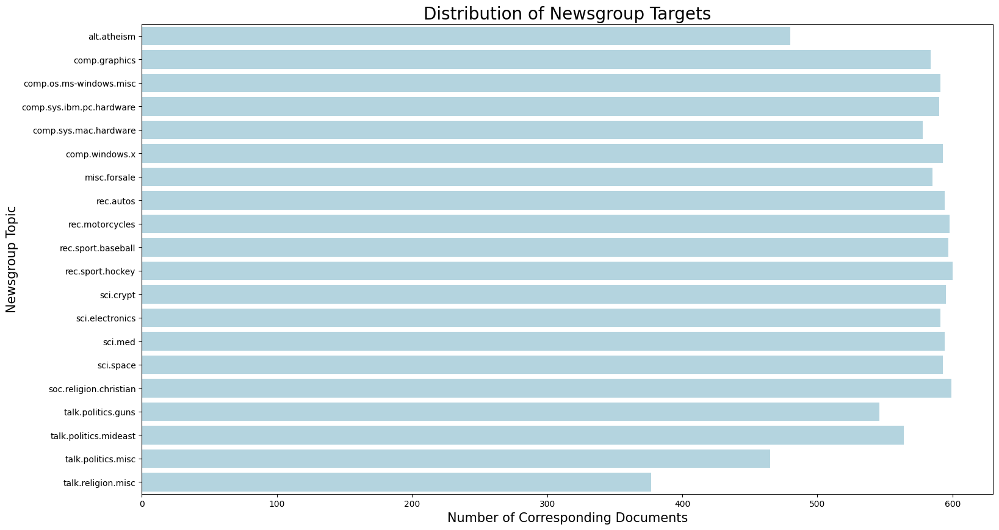

In [14]:
# plot the distribution of the newsgroups
fig1 = plt.figure(figsize =[18 ,10])
ax = sns.countplot(y=newsgroup_df['newsgroup'], color="lightblue", order=dataset.target_names)
plt.title('Distribution of Newsgroup Targets', size=20)
plt.ylabel('Newsgroup Topic', size = 15)
plt.xlabel('Number of Corresponding Documents', size = 15)
plt.show()

Some of the topics overlap in terms of abstract concepts, such as "alt.atheism" and "soc.religion.christian". We are interested in seeing how topic modeling is able to extract different themes from a wide range of subjects, so we will only look at a subset of 10 unique topics that share minimal overlap. These topics are: graphics, sale, motorcycles, hockey, cryptography, medical, space, religion, guns, and middle east politics.

In [15]:
# obtain a subset of the original data; only include 10 diverse topics
newsgroup_df = newsgroup_df[newsgroup_df["newsgroup"].isin([
    "comp.graphics", "misc.forsale", "rec.motorcycles",
    "rec.sport.hockey", "sci.crypt", "sci.med",
    "sci.space", "soc.religion.christian", "talk.politics.guns",
    "talk.politics.mideast"
])]

In [16]:
newsgroup_df["newsgroup"].value_counts()

rec.sport.hockey          600
soc.religion.christian    599
rec.motorcycles           598
sci.crypt                 595
sci.med                   594
sci.space                 593
misc.forsale              585
comp.graphics             584
talk.politics.mideast     564
talk.politics.guns        546
Name: newsgroup, dtype: int64

The distribution of our categories appear to be fairly even, which we hope will be helpful for our algorithm to learn 10 distinct groups without favoring an outlier group. We can now explore the distribution of our topics to get a better understanding of our data.

In [17]:
# get the number of words per document, words are separated by " "
words_per_document = newsgroup_df["document"].apply(lambda x: len(x.split(" ")))
# get mean words across all documents
mean_words = words_per_document.mean()
# get standard deviation across all documents
std_words = words_per_document.std()

# print descriptive statistics
print("mean number of words:", mean_words,
      f"\nstandard deviation of number of words:", std_words)

mean number of words: 347.9247183339024 
standard deviation of number of words: 725.8041830310069


In [18]:
#total number of distinct words
print("total number of distinct words:", sum(words_per_document.unique()))

total number of distinct words: 1009834


In [19]:
print('max words per document:', max(words_per_document), f'\nmin words per document:', min(words_per_document))

max words per document: 20235 
min words per document: 11


As we can see, there are large deviations per document and there are over a million unique terms in our collection of documents. We want our model to extract meaningful themes from our data, and we need to do this efficiently, so we will preprocess the data to only include necessary tokens. We will first clean the documents by removing punctation, numbers, and characters, converting to lowercase, stripping empty strings, and deleting tokens smaller than 2 characters. We will also remove non-descriptive words such as "a", "is", "from", "and", etc. We will add additional stop words that occur often in our dataset but do not have any significant meaning for the theme extraction. Lastly, we will lemmatize our documents, meaning we will distill words into their foundational terms, like "running" to "run". This will help reduce unnecessary and redundant terms and ensure a faster runtime.

In [20]:
# List of stop words
additional_stop_words = set(["edu", "subject", "com", "article", "like", "nntp", "thanks",
                            "just", "apr", "don", "university", "___"])
# add our stop words to defualt list of english stop words
stop_words = ENGLISH_STOP_WORDS.union(additional_stop_words)

# write a function that can be used to tokenize our data
# implement tokenizer using TweetTokenizer
def tokenizer(text):
    tokenizer = TweetTokenizer()
    tokens = tokenizer.tokenize(text)
    return tokens

# clean the text by removing unnecessary characters, removing whitespace,
# lemmatizing and removing short tokens
def process_text(text):
    # Lowercase
    text = text.lower()
    # Remove punctuation, numbers, special characters, \n, and extra whitespaces
    text = re.sub(r'\d+|[^\w\s]', ' ', text)
    text = re.sub(r'\n+', ' ', text)
    text = re.sub(r'\s{2,}', ' ', text)
    # Tokenize and lemmatize
    wnl = WordNetLemmatizer()
    tokens = [wnl.lemmatize(word) for word in tokenizer(text) if word not in stop_words]
    # remove empty tokens or tokens that are less than two characters
    text = [each for each in tokens if len(each) > 2]
    text = [each for each in text if ' ' not in each]
    return " ".join(text)

Now that we have come up with a function to process our data, we can look at an example to make sure our function is doing what we intend it to do.

In [21]:
# example document with raw content
newsgroup_df['document'][6]

'From: bmdelane@quads.uchicago.edu (brian manning delaney)\nSubject: Brain Tumor Treatment (thanks)\nReply-To: bmdelane@midway.uchicago.edu\nOrganization: University of Chicago\nLines: 12\n\nThere were a few people who responded to my request for info on\ntreatment for astrocytomas through email, whom I couldn\'t thank\ndirectly because of mail-bouncing probs (Sean, Debra, and Sharon).  So\nI thought I\'d publicly thank everyone.\n\nThanks! \n\n(I\'m sure glad I accidentally hit "rn" instead of "rm" when I was\ntrying to delete a file last September. "Hmmm... \'News?\' What\'s\nthis?"....)\n\n-Brian\n'

In [22]:
# example document with processed content
process_text(newsgroup_df['document'][6])

'bmdelane quad uchicago brian manning delaney brain tumor treatment reply bmdelane midway uchicago organization chicago line people responded request info treatment astrocytomas email couldn thank directly mail bouncing probs sean debra sharon thought publicly thank sure glad accidentally hit instead trying delete file september hmmm news brian'

We can see that our function is doing what we intended to do; clean the data to only include potentially relevant terms. We can therefore apply this algorithm to all the documents in our dataset.

In [23]:
# process text for all documents
newsgroup_df['processed_documents'] = newsgroup_df['document'].apply(process_text)
newsgroup_df['processed_documents']

3        jgreen amber joe green weitek organization har...
4        jcm head cfa harvard jonathan mcdowell shuttle...
5        dfo vttoulu tko vtt foxvog douglas rewording s...
6        bmdelane quad uchicago brian manning delaney b...
10       irwin cmptrc lonestar org irwin arnstein recom...
                               ...                        
11305    shaig composer think shai guday hezbollah orga...
11307    chein eng auburn tsan heui case deal lemon pos...
11309    jim zisfein factory jim zisfein migraine scan ...
11312    steve hcrlgw steven collins sphere point organ...
11313    gunning cco caltech kevin gunning stolen cbr o...
Name: processed_documents, Length: 5858, dtype: object

We can also look at the top 20 most common words among all the documents to adjust our stop word list from before if we see words that are not meaningful. Most of these words will be ignored because of our TF-IDF vectorizer parameter "max_df" anyways.

In [24]:
# Get the top 20 most common words among all the documents

p_text = ' '.join(newsgroup_df['processed_documents'].tolist())

p_text = p_text.split(' ')

# Top 20
top_20 = pd.DataFrame(
    Counter(p_text).most_common(20),
    columns=['word', 'frequency']
)

top_20

,word,frequency
0,line,6683
1,organization,5923
2,writes,4053
3,people,3699
4,posting,2918
5,time,2898
6,know,2857
7,think,2502
8,host,2401
9,year,2299


### NMF - Non-Negative Matrix Factorization

Now that our data is preprocessed, we can implement NMF to extract themes! We hope to extract the 10 themes that we started with: graphics, sale, motorcycles, hockey, cryptography, medical, space, religion, guns, and middle east politics.

First, we must vectorize our processed documents into a TF-IDF (Term Frequency-Inverse Document Frequency) matrix. For our parameters we chose max_df = 0.95, min_df=2, and max_features=1000.

max_df - ignore terms that appear in more than 95% of the documents

min_df - ignore terms that appear in less than 2 documents

max_features - consider the top 1000 features ordered by term frequency across the corpus; only looks at top 1000 most important features and improves consistency

In [25]:
# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000)

# Fit and transform the processed abstracts into TF-IDF
tfidf = vectorizer.fit_transform(newsgroup_df['processed_documents'])

We then implement the NMF algorithm using sklearn. We return a W (document-topic matrix) and H (topic-term) matrix.

In [26]:
def do_nmf(tfidf, n_topics):
    # Specify the number of topics
    nmf_model = NMF(n_components=n_topics)
    W = nmf_model.fit_transform(tfidf)  # Document-topic matrix   (n_samples, n_components)
    H = nmf_model.components_         # Topic-term matrix       (n_components, n_features)
    return W, H, nmf_model

In [27]:
# we chose a subset of 10 topics from our 20newsgroup dataset
n_topics = 10
W, H, nmf_model = do_nmf(tfidf, n_topics)

In [28]:
# return top ten topics and the top ten words corresponding to each topic
feature_names = vectorizer.get_feature_names_out()
for index, topic in enumerate(H):
    print(f"Topic #{index}:")
    print(",".join([feature_names[i] for i in topic.argsort()[-10:]]))  # Top 10 words per topic

Topic #0:
say,believe,faith,bible,christ,people,church,jesus,christian,god
Topic #1:
crypto,phone,netcom,algorithm,government,escrow,encryption,clipper,chip,key
Topic #2:
software,new,distribution,offer,mail,host,posting,file,graphic,sale
Topic #3:
reply,computer,science,soon,univ,pittsburgh,bank,gordon,geb,pitt
Topic #4:
win,year,playoff,season,play,nhl,player,hockey,team,game
Topic #5:
state,right,peace,policy,jewish,palestinian,jew,arab,israeli,israel
Topic #6:
pat,alaska,jpl,moon,orbit,digex,access,gov,space,nasa
Topic #7:
handgun,crime,criminal,control,law,right,weapon,firearm,people,gun
Topic #8:
azeri,genocide,greek,turkey,serdar,argic,turk,armenia,turkish,armenian
Topic #9:
bnr,helmet,rider,riding,writes,dog,ride,motorcycle,dod,bike


#### NMF Evaluation - Inspection and Visualization

Our topics appear to appropriately represent our 10 topics.

Topic 0 could be attributed as ""soc.religion.christian" for example. The distribution of the top 10 words seem to be fairly consistent within each topic as well. For example, say, believe, faith, bible, christ, people, church, jesus, christian, god all relate to religion.

Topic 1 can be mapped to "sci.crypt" with consistent top words.

Topic 2 can be mapped to either "comp.graphics" or "misc.forsale", meaning that our model was not able to directly extract these two themes and instead grouped them together. We will explore this more in the visualization.

Topic 3 is also misleading as none of the values relate specifically to medicine but pittsburgh is a medical school.

Topic 4 can be mapped to "rec.sport.hockey" with consistent top words.

Topic 5 can be mapped to "talk.politics.mideast" with consistent top words, although topic 8 could also be mapped to "talk.politics.mideast" with consistent top words. Our algorithm chose to separate the "talk.politics.mideast" theme into two sub themes.

Topic 6 can be mapped to "sci.space" with fairly consistent top words (pat, alaska, jpl, and digex are still relevant to space; pat is a space researcher, alaska owns a NASA satellite, jpl is a propulsion lab, and digex is  a technology used primarily by the space newsgroup).

Topic 7 can be mapped to "talk.politics.guns" with consistent top words.

And, finally, topic 9 can be mapped to "rec.motorcycles" with fairly consistent top words (bnr, writes, dog, and dod) are irrelevant.

Overall, our model was able to detect most of the 10 overall topics, with some difficulties for the graphic, sale, mideast and medicine topics.

In [29]:
# look at top words for each topic based on highest probability
# here we get top 3 words
components = H
terms = vectorizer.get_feature_names_out()

# Function to map top n words to topics
def top_topics(components, terms, num_words):
    # Create output series
    top_topics = pd.Series(dtype=object)

    for idx, component in enumerate(components):
        # Create a series mapping terms to their probabilities for this topic
        term_topic = pd.Series(component, index=terms)
        # Sort by probabilities in descending order
        term_topic.sort_values(ascending=False, inplace=True)
        # Take the top 5 words for this topic
        top_topics['topic' + str(idx)] = list(term_topic.iloc[:num_words].index)

    return top_topics

# Map words to topics
top_topics_output = top_topics(components, terms, 3)

# Print topics and their associated words
print("Topics\t\tTop Words")
for idx, item in zip(top_topics_output.index, top_topics_output):
    print(f"{idx}\t\t{item}")

Topics		Top Words
topic0		['god', 'christian', 'jesus']
topic1		['key', 'chip', 'clipper']
topic2		['sale', 'graphic', 'file']
topic3		['pitt', 'geb', 'gordon']
topic4		['game', 'team', 'hockey']
topic5		['israel', 'israeli', 'arab']
topic6		['nasa', 'space', 'gov']
topic7		['gun', 'people', 'firearm']
topic8		['armenian', 'turkish', 'armenia']
topic9		['bike', 'dod', 'motorcycle']


In [30]:
# Map words to topics
first_topic = top_topics(components, terms, 1)

# Print topics and their associated words
topics = list(first_topic.apply(lambda x: x[0]))
for i, name in enumerate(topics):
    print(f"Topic{i}:", name)

Topic0: god
Topic1: key
Topic2: sale
Topic3: pitt
Topic4: game
Topic5: israel
Topic6: nasa
Topic7: gun
Topic8: armenian
Topic9: bike


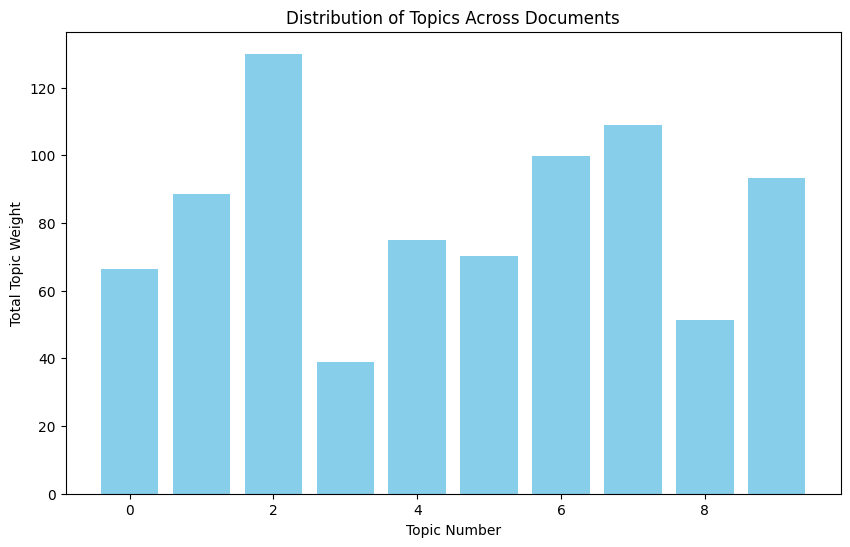

In [31]:
# Transform the documents into topic distributions
document_topics = nmf_model.transform(tfidf)

# Sum the topic weights across all documents
topic_distribution = np.sum(document_topics, axis=0)

# Plot the distribution
plt.figure(figsize=(10, 6))
plt.bar(range(len(topic_distribution)), topic_distribution, color='skyblue')
plt.xlabel('Topic Number')
plt.ylabel('Total Topic Weight')
plt.title('Distribution of Topics Across Documents')
plt.show()

As we can see, the values with the lowest topic weight are the topics that did not match our themes, i.e. topic 3 and topic 8.

We can take a look at how our model clustered topics using TSNE (t-Distributed Stochastic Neighbor Embedding), a statistical method for visualizing high-dimensional data by reducing it to lower- dimensional spaces. It provides a visual representation of how well-separated or cohesive our topics are.

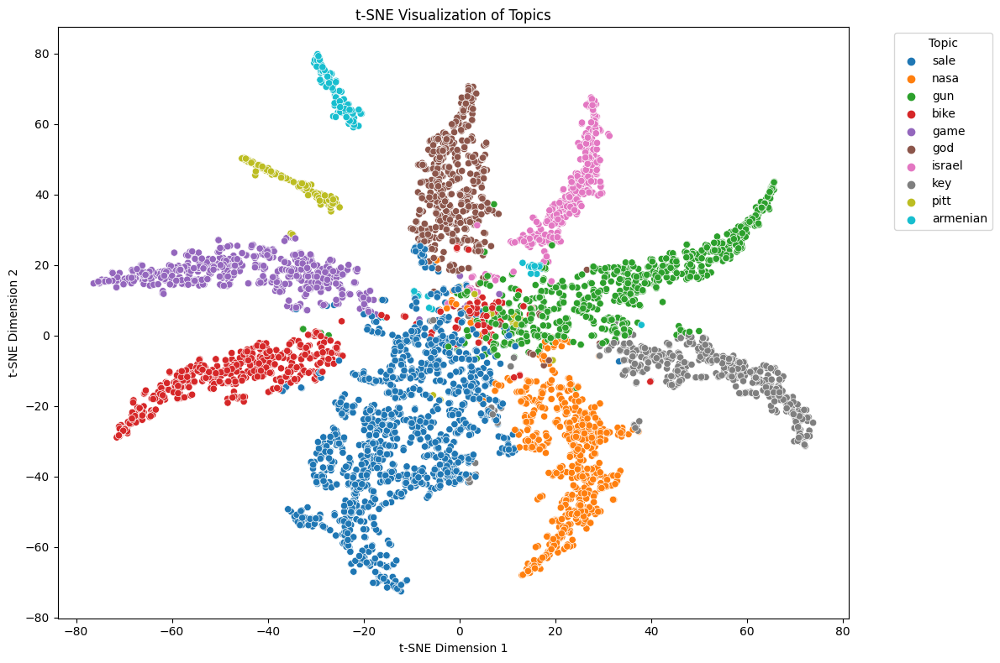

In [32]:
# Define topic names based on your interpretation of the topics
topic_names = {index: topic for index, topic in enumerate(topics)}

# Transform the documents into topic distributions
document_topics = nmf_model.transform(tfidf)

# Assign a dominant topic to each document
dominant_topics = np.argmax(document_topics, axis=1)

# Replace numerical labels with topic names
dominant_topic_names = pd.Series(dominant_topics).map(topic_names)

# Reduce dimensions to 2D using t-SNE
tsne_model = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_values = tsne_model.fit_transform(document_topics)

# Create a DataFrame for plotting
tsne_df = pd.DataFrame({
    "Dimension 1": tsne_values[:, 0],
    "Dimension 2": tsne_values[:, 1],
    "Topic": dominant_topic_names
})

# Create a scatter plot
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=tsne_df,
    x="Dimension 1",
    y="Dimension 2",
    hue="Topic",
    palette='tab10',
    legend='full'
)

# Customize plot
plt.title('t-SNE Visualization of Topics')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Topic', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Most of the topics form distinct clusters in the t-SNE plot, indicating that the topics are reasonably well-separated in the embedding space. "Game" (purple) and "God" (brown) form tight clusters, representing coherent groupings of documents. The sale cluster seems to be the biggest, which makes sense considering that it grouped sale and graphic together. Pitt appears to be very small, along with Armenian, suggesting that there aren't many documents that fall into these groups. There also seems to be a lot of overlap in the middle, which could result in incorrect clustering. The overlap between "Key" (gray), "Gun" (green), and "NASA" (orange) might reflect shared words or contexts in the documents. Topics like "Armenian" (cyan) and "Pitt" (yellow) are tightly packed, suggesting high coherence and similarity among documents in these topics. Topics like "Gun" (green) and "Sale" (blue) are more spread out, indicating that the documents assigned to these topics are more diverse and less well-defined. "NASA" (orange) and "God" (brown) are relatively close, which may reflect some contextual overlap, perhaps due to discussions about space and philosophy. A few points appear scattered outside the main clusters (e.g., lone points near the middle or periphery). These could represent noisy documents that do not fit well into any topic or documents with mixed themes that overlap multiple topics.

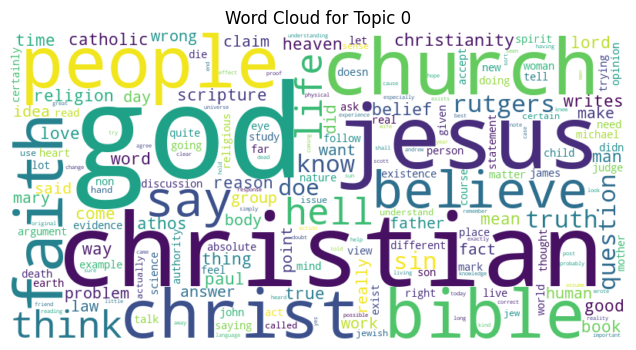

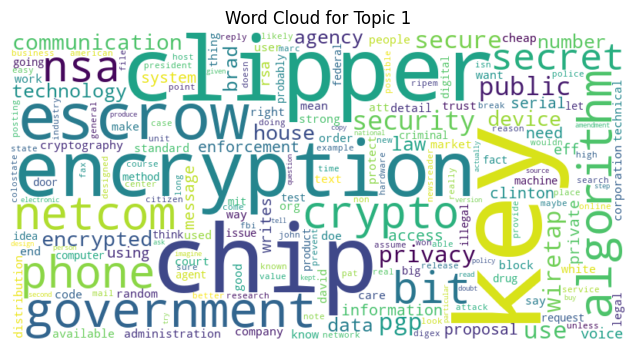

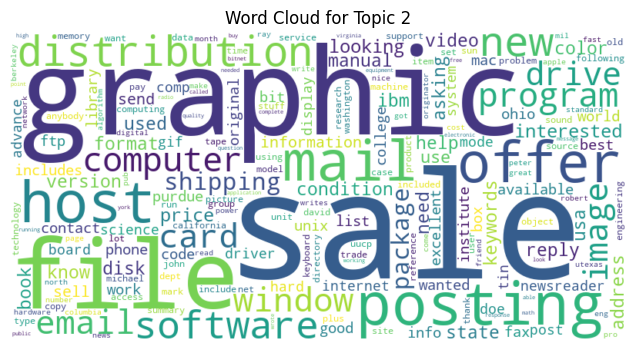

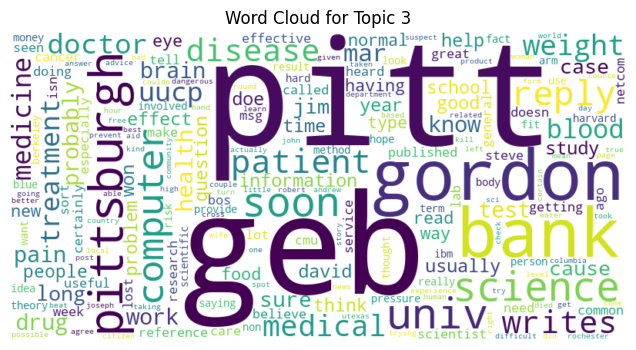

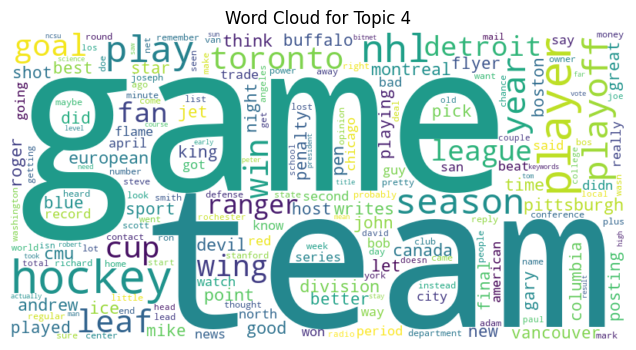

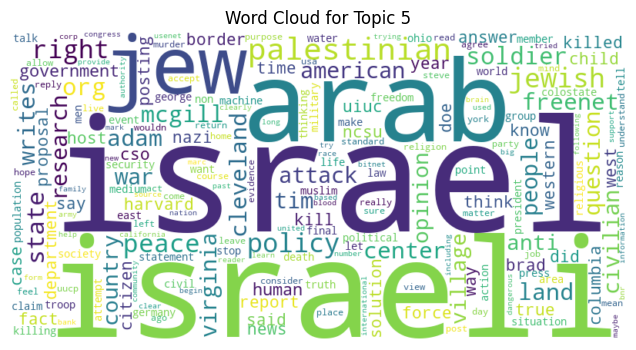

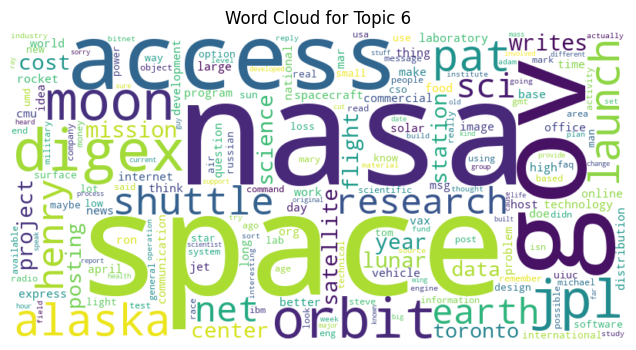

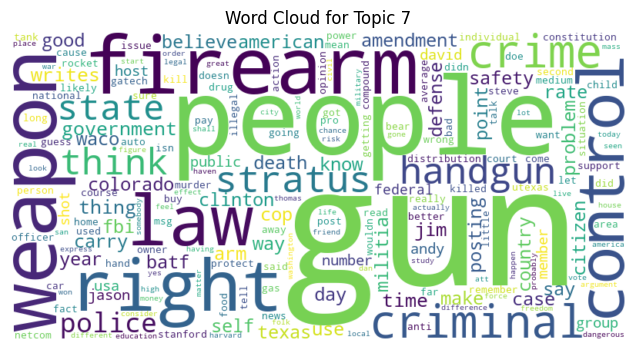

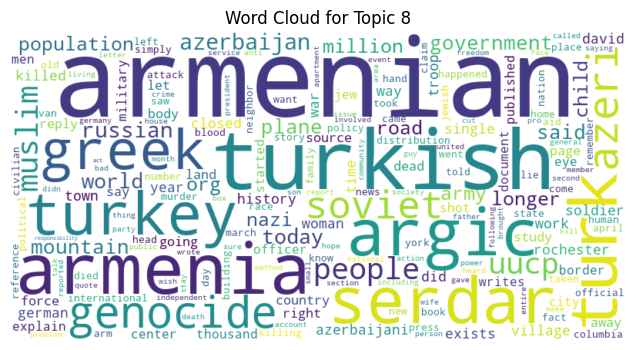

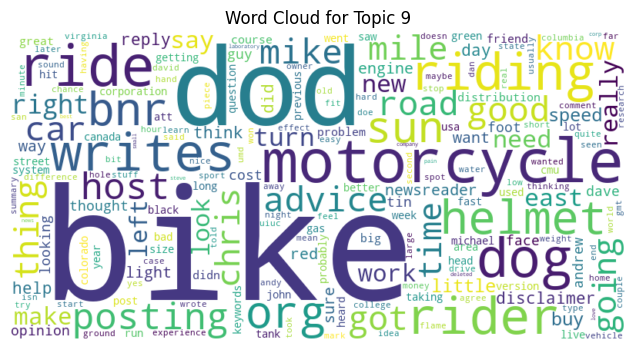

In [33]:
# Generate a word cloud for each topic
for idx, topic in enumerate(nmf_model.components_):
    # Create a dictionary of words and their probabilities
    word_freq = {terms[i]: topic[i] for i in range(len(terms))}
    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

    # Plot the word cloud
    plt.figure(figsize=(8, 4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for Topic {idx}")
    plt.show()

We can also see the distribution of words for each topic.

Topic 0 appears to represent religion fairly well, topic 1 represents cryptography very well, topic 2 represents both graphics and sale, topic 3 represents medicine fairly well with some irrelevant terms, topic 4 represents hockey very well, topic 5 represents mideast very well, topic 6 represents space very well, topic 7 represents guns very well, topic 8 represents mideast very well, and topic 9 represents motorcycle fairly well but has some irrelevant words.

We can also get the topic that is most relevant to a given document based on the NMF W matrix on the probabilities of topics.

In [34]:
# Let's say we want the topic distribution for the first document (index 0)
document_index = 1
document_topics = W[document_index]  # Get topic weights for this document

# Identify the dominant topic for this document
dominant_topic = np.argmax(document_topics)

print(f"Document #{document_index + 1} dominant topic: Topic {dominant_topic + 1}")
print(f"Topic Distribution for Document #{document_index + 1}:")
for topic_idx, weight in enumerate(document_topics):
    print(f"Topic {topic_idx + 1}: {weight:.4f}")

# Print the top words for the dominant topic to understand its meaning
top_word_indices = H[dominant_topic].argsort()[-5:]  # Top 10 words for the dominant topic
print(f"\nTop 5 words for Dominant Topic {dominant_topic + 1}:")
print(" ".join([feature_names[i] for i in top_word_indices]))
print(f"\nActual Newsgroup:")
print(newsgroup_df.iloc[document_index]["newsgroup"])
print(f"\nDocument Content:")
print(newsgroup_df.iloc[document_index]["document"])

Document #2 dominant topic: Topic 7
Topic Distribution for Document #2:
Topic 1: 0.0109
Topic 2: 0.0045
Topic 3: 0.0253
Topic 4: 0.0000
Topic 5: 0.0032
Topic 6: 0.0066
Topic 7: 0.0365
Topic 8: 0.0059
Topic 9: 0.0006
Topic 10: 0.0040

Top 5 words for Dominant Topic 7:
digex access gov space nasa

Actual Newsgroup:
sci.space

Document Content:
From: jcm@head-cfa.harvard.edu (Jonathan McDowell)
Subject: Re: Shuttle Launch Question
Organization: Smithsonian Astrophysical Observatory, Cambridge, MA,  USA
Distribution: sci
Lines: 23

From article <C5owCB.n3p@world.std.com>, by tombaker@world.std.com (Tom A Baker):
>>In article <C5JLwx.4H9.1@cs.cmu.edu>, ETRAT@ttacs1.ttu.edu (Pack Rat) writes...
>>>"Clear caution & warning memory.  Verify no unexpected
>>>errors. ...".  I am wondering what an "expected error" might
>>>be.  Sorry if this is a really dumb question, but
> 
> Parity errors in memory or previously known conditions that were waivered.
>    "Yes that is an error, but we already knew

We were able to map our document to the most relevant topic!

It seems like our model was able to detect 8 of our 10 topics correctly. It incorrectly grouped graphic and sale together into one and incorrectly split mideast into two topics. We may want to see how many of our documents were able to be mapped to the correct topic. We visualize this below by grouping by the labeled newsgroup and the dominant topic like we did above, and then counting the number of documents in each. This can tell us, for example, how many documents that were labeled space (topic 7) came from the sci.space newsgroup.

In [52]:
# Step 3: Assign topics to each document
newsgroup_df["Dominant Topic"] = W.argmax(axis=1)

# Group and reshape the data
grouped = newsgroup_df.groupby(["newsgroup", "Dominant Topic"]).count()["document"].reset_index()
pivoted = grouped.pivot(index="newsgroup", columns="Dominant Topic", values="document").fillna(0)

# Generate the interactive chart
fig = go.Figure()

# Add one bar trace for each topic
for topic in pivoted.columns:
    fig.add_trace(
        go.Bar(
            x=pivoted.index,
            y=pivoted[topic],
            name=f"Topic {topic}",
            visible=(topic == 0)  # Show only Topic 0 by default
        )
    )

# Add dropdown for interactivity
buttons = [
    dict(
        label=f"Topic {topic}",
        method="update",
        args=[
            {"visible": [i == topic for i in range(len(pivoted.columns))]},
            {"title": f"Documents per Newsgroup for Topic {topic}"}
        ]
    )
    for topic in pivoted.columns
]

fig.update_layout(
    updatemenus=[dict(active=0, buttons=buttons)],
    title="Documents per Newsgroup by Topic",
    xaxis_title="Newsgroup",
    yaxis_title="Number of Documents",
    barmode="group"
)
# Save the plot as an HTML file
fig.write_html("interactive_plot_nmf.html", include_plotlyjs="cdn")
# Show the interactive plot
fig.show()

We can see that most of the documents that had topic 0 as the dominant topic (say,believe,faith,bible,christ,people,church,jesus,christian,god) were from the soc.religion.christian newsgroup. 

Most of the documents that had topic 1 as the dominant topic (crypto,phone,netcom,algorithm,government,escrow,encryption,clipper,chip,key) were from sci.crypt. 

Most of the documents that had topic 2 as the dominant topic (software,new,distribution,offer,mail,host,posting,file,graphic,sale) were mostly from comp.graphics and misc.forsale, with some documents from the other newsgroups as well. 

Most of the documents that had topic 3 as the dominant topic (reply,computer,science,soon,univ,pittsburgh,bank,gordon,geb,pitt) were from sci.med, but only 140 of the 500. 

Most of the documents that had topic 4 as the dominant topic (win,year,playoff,season,play,nhl,player,hockey,team,game) were from rec.sport.hockey.

Most of the documents that had topic 5 as the dominant topic (state,right,peace,policy,jewish,palestinian,jew,arab,israeli,israel) were from talk.politics.mideast, but only 350 of the 550.

Most of the documents that had topic 6 as the dominant topic (pat,alaska,jpl,moon,orbit,digex,access,gov,space,nasa) were from sci.space, with some from sci.med.

Most of the documents that had topic 7 as the dominant topic (handgun,crime,criminal,control,law,right,weapon,firearm,people,gun) were from talk.politics.guns, with some documents from sci.med, sci.crypt, and talk.politics.mideast.

Most of the documents that had topic 8 as the dominant topic (azeri,genocide,greek,turkey,serdar,argic,turk,armenia,turkish,armenian) were from talk.politics.mideast but only 150 of the 550.

Most of the documents that had topic 9 as the dominant topic 
(bnr,helmet,rider,riding,writes,dog,ride,motorcycle,dod,bike) were from rec.motorcycles, with some from sci.med.

Except for topics 3, 5, and 8, all of the other topics were able to get the full scope of the 500 documents in each newsgroup.

#### Topic Diversity

Topic diversity measures how distinct the topics are from each other, based on their overlap or similarity.

"The more diverse the resulting topics are, the higher will be the coverage of the various aspects of the analyzed corpus. It is therefore important to also obtain topics that are different from each other (rather than just considering how much coherent the topics are)." -Silvia Terragni (https://github.com/silviatti/topic-model-diversity)

In [ ]:
top_ten_labels = H.argsort(axis=1)[:,-10:]
nmf_topics_output = dict()
nmf_topics_output['topics'] = [[feature_names[i] for i in x] for x in top_ten_labels]

In [37]:
metric = TopicDiversity(topk=10) # Initialize metric
topic_diversity_score_nmf_18 = metric.score(nmf_topics_output) # Compute score of the metric
topic_diversity_score_nmf_18

0.98

#### Residual Score (NMF only)

"Residuals are differences between the observed and predicted values of the data. A residual of 0 means the topic perfectly approximates the text of the article, so the lower the better.

To calculate the residual you can take the Frobenius norm (square root of the sum of the absolute squares of its elements) of the tf-idf weights (A) minus the dot product of the coefficients of the topics (H) and the topics (W). We can then get the average residual for each topic to see which has the smallest residual on average." - https://freedium.cfd/https://towardsdatascience.com/topic-modeling-articles-with-nmf-8c6b2a227a45
<br><br><br>
How well do the topics approximate the original weights of the tfidf matrix for each document?
Averaged across topics, can get the sense of how good of an approximator each topic is.

Residual$[x_i]$$\norm{x_i - W_i \dot H}_F$ where document $x_i \in$ documents $X$, $W_i$ is row i of the Document-topic matrix and $H$ is the Topic-term matrix    

In [38]:
# For each document calculate the difference between the original tfidf weights and those predicted
# by multiplying W and H for that specific row.
# Cell Source: https://freedium.cfd/https://towardsdatascience.com/topic-modeling-articles-with-nmf-8c6b2a227a45
def do_residual(tfidf, W, H):
    residuals = np.zeros(tfidf.shape[0])
    for row in range(tfidf.shape[0]):
        # 'fro' here means we are using the Frobenium norm as the distance metric
        residuals[row] = np.linalg.norm(tfidf[row, :] - W[row, :].dot(H), 'fro')
    return residuals

residuals = do_residual(tfidf, W, H)
residuals

array([0.95825439, 0.98622845, 0.95352635, ..., 0.98286503, 0.96884813,
       0.98304679])

In [39]:
np.mean(residuals)

0.9378036882062382

Text(0.5, 1.0, 'Average Residual per Document by Main Topic')

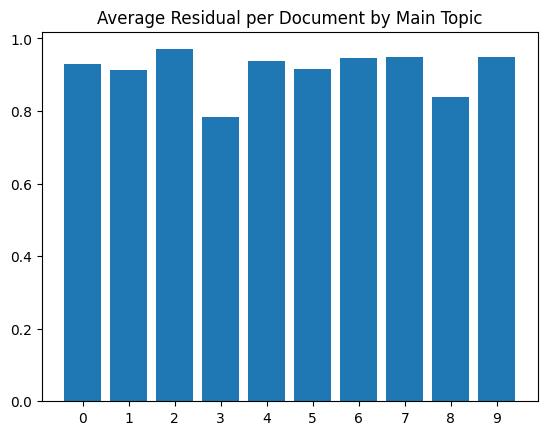

In [40]:
residuals_by_topic = pd.Series(residuals).groupby(np.argmax(W, axis=1)).mean()
plt.bar(x=residuals_by_topic.index, height=residuals_by_topic.values)
plt.xticks(residuals_by_topic.index)
plt.title("Average Residual per Document by Main Topic")

Residuals are nearly indistinguishable by visualization.

In [41]:
residuals_by_topic.sort_values(ascending=False)

2    0.970286
7    0.949329
9    0.948965
6    0.946627
4    0.937936
0    0.930820
5    0.916385
1    0.912482
8    0.838200
3    0.784865
dtype: float64

Topic 1 has the lowest residual while topic 2 has the highest.

#### "Expert" Manual Evaluation

Since relevance is difficult to interpret without a baseline, we compare the two for quality below by inspecting sets of training instances.

In [42]:
chosen_topic_1 = np.random.choice(np.array(range(tfidf.shape[0]))[np.argmax(W, axis=1)==1], size=5, replace=False)
display([feature_names[i] for i in H[1].argsort()[-10:]])
for i, content in newsgroup_df['document'].iloc[chosen_topic_1].items(): display((i, content))
chosen_topic_2 = np.random.choice(np.array(range(tfidf.shape[0]))[np.argmax(W, axis=1)==2], size=5, replace=False)
display([feature_names[i] for i in H[2].argsort()[-10:]])
for i, content in newsgroup_df['document'].iloc[chosen_topic_2].items(): display((i, content))

['crypto',
 'phone',
 'netcom',
 'algorithm',
 'government',
 'escrow',
 'encryption',
 'clipper',
 'chip',
 'key']

(4791,
 'From: rboudrie@chpc.org (Rob Boudrie)\nSubject: Re: Once tapped, your code is no good any more.\nOrganization: Center For High Perf. Computing of WPI; Marlboro Ma\nDistribution: na\nLines: 26\n\nIn article <C5so84.Hxv@demon.co.uk> Graham Toal <gtoal@gtoal.com> writes:\n>In article <2073@rwing.UUCP> pat@rwing.UUCP (Pat Myrto) writes:\n>:If the Clinton Clipper is so very good, why not make its algrithm public\n>:so many people can exchange ideas and examine it, rather than a few\n>:isolated \'respected experts\' (respected by whom?  for what?  Perhaps a\n\nOne more time...\n\n    If they released the algorithm, it would be possible for someone\n    to come up with an implementation which was identical, but\n    lacking an escrowed key.\n\n    Note that the press announcement mentioned that the algorithm was\n    being kept secret for security of the key escrow system.  In this\n    case security means "an escrowed key for EVERY clipper chip".\n\n\n    Assuming you believed all t

(5369,
 "From: alan@saturn.cs.swin.OZ.AU (Alan Christiansen)\nSubject: Re: Sphere from 4 points?\nOrganization: Swinburne University of Technology\nLines: 71\nNNTP-Posting-Host: saturn.cs.swin.oz.au\n\nspworley@netcom.com (Steve Worley) writes:\n\n>bolson@carson.u.washington.edu (Edward Bolson) writes:\n\n>>Boy, this will be embarassing if it is trivial or an FAQ:\n\n>>Given 4 points (non coplanar), how does one find the sphere, that is,\n>>center and radius, exactly fitting those points?  I know how to do it\n>>for a circle (from 3 points), but do not immediately see a \n>>straightforward way to do it in 3-D.  I have checked some\n>>geometry books, Graphics Gems, and Farin, but am still at a loss?\n>>Please have mercy on me and provide the solution?  \n\n>It's not a bad question: I don't have any refs that list this algorithm\n>either. But thinking about it a bit, it shouldn't be too hard.\n\n>1) Take three of the points and find the plane they define as well as\n>the circle that they

(4300,
 "From: C445585@mizzou1.missouri.edu (John Kelsey)\nSubject: Competing standard\nNntp-Posting-Host: mizzou1.missouri.edu\nOrganization: University of Missouri\nLines: 22\n\n   Perhaps one way of getting away from this cripple chip that the U.S.\ngovernment seems to be pushing would be to come up with a good alternative.\nFor example, how about a scheme using RSA, and some hybrid of DES-CFB and\nanother strong stream cipher (Maybe IDEA-CFB)?  This could be substantially\nthe same as the cripple chip, except that instead of key-registration, the\npolice could demand that you give up your secret key to them (with a court-\nissued warrant).  Then, they could read the last few months of wiretapped\nmessages you've sent, and assuming you've committed no crimes, you could\ngenerate a new key pair and go about your business.  I find that I'd be\nwilling to pay RSA for the right to use such a system, especially given the\nalternative.  If you were unwilling to give up your secret key, th

(8321,
 'From: jebright@magnus.acs.ohio-state.edu (James R Ebright)\nSubject: Re: Once tapped, your code is no good any more.\nNntp-Posting-Host: bottom.magnus.acs.ohio-state.edu\nOrganization: The Ohio State University\nDistribution: na\nLines: 29\n\nIn article a_rubin@dsg4.dse.beckman.com (Arthur Rubin) writes:\n>In strnlght@netcom.com (David Sternlight) writes:\n>\n[...]\n>>I\'d be happy to use a crypto system supplied by the NSA for business, if\n>>they told me it was more secure than DES, and in particular resistant to\n>>attempts by Japanese, French, and other competitive companies and\n>>governments to break.\n>\n>(It\'s NIST, not NSA.  NSA is not supposed to have anything to do with this.)\n\nWith all the activity in sci.crypt these past few days, I am not supprised\nyou missed it... NIST got Skipjack from the NSA :)\n\n[...]\n>>I\'d trust the NSA or the President if they stated there were no trap\n>>doors--I\'d be even happier if a committee of independent experts examined\n>>

(4429,
 "From: steve-b@access.digex.com (Steve Brinich)\nSubject: Re: Off the shelf cheap DES keyseach machine (Was: Re: Corporate acceptance of the wiretap chip)\nOrganization: Express Access Online Communications, Greenbelt, MD USA\nLines: 17\nNNTP-Posting-Host: access.digex.net\n\n > > :Thousands?  Tens of thousands?  Do some arithmetic, please...  Skipjack\n > > :has 2^80 possible keys.\n > >\n > > We don't yet know if all 80 bits count.\n >\n > That doesn't worry me at all; they're not going to cheat at something\n >they can get caught at.  And key size is one of the things that can be\n >verified externally.  Feed lots of random key/input pairs into the\n >chip, then see what happens to the output....\n\n  If the device is designed to use the key that's registered with the Feds,\nI don't see how you -can- feed it a different key.  If the user can change\nthe key to any of the 2^80 possibilities, the main reason for regarding\nthis proposal as unacceptable disappears.\n\n\n\n")

['software',
 'new',
 'distribution',
 'offer',
 'mail',
 'host',
 'posting',
 'file',
 'graphic',
 'sale']

(6523,
 "From: brentb@tamsun.tamu.edu (Brent)\nSubject: Re: Please Recommend 3D Graphics Library For Mac.\nOrganization: Texas A&M Univ., Inc.\nLines: 44\nNNTP-Posting-Host: tamsun.tamu.edu\n\ntsa@cellar.org (The Silent Assassin) writes:\n>rgc3679@bcstec.ca.boeing.com (Robert G. Carpenter) writes:\n>\n>> Can you please offer some recommendations?\n>\n>It's really not that hard to do.  There are books out there which explain\n>everything, and the basic 3D functions, translation, rotation, shading, and\n>hidden line removal are pretty easy.  I wrote a program in a few weeks witht\n>he help of a book, and would be happy to give you my source.\n\nI think he wanted to avoid reinventing the wheel.\nI would suggest that you take your code, and submit it to\ncomp.sys.mac.binaries to be distributed (including to the ftp sites). \nMany folks, myself included, would enjoy the extra code.\n\n>\tAlso, Quickdraw has a lot of 3D functions built in, and Think pascal\n>can access them, and I would expe

(1502,
 'From: jamesl@galaxy.nsc.com (James Lu x3702)\nSubject: WANTED: refrigerator.\nNntp-Posting-Host: gallium.nsc.com\nOrganization: National Semiconductor, Santa Clara\nDistribution: ba\nLines: 9\n\n\nWANTED:\n\n     Refrigerator.\n    \n     contact: (408)721-3702\n              jamesl@galaxy.nsc.com\n\n \n')

(328,
 'From: joachim@kih.no (joachim lous)\nSubject: Re: XV for MS-DOS !!!\nOrganization: Kongsberg Ingeniorhogskole\nLines: 20\nNNTP-Posting-Host: samson.kih.no\nX-Newsreader: TIN [version 1.1 PL8]\n\nNOE-MAILADDRESS@eicn.etna.ch wrote:\n> I\'m sorry for...\n\n>     1)  The late of the answer but I couldn\'t find xv221 for msdos \'cause \n> \tI forgot the address...but I\'ve retrieve it..\n\n>     2)  Posting this answer here in comp.graphics \'cause I can\'t use e-mail,\n>    ^^^  not yet....\n\n>    2) My bad english \'cause I\'m a Swiss and my language is french....\n    ^^^\nIf french is your language, try counting in french in stead, maybe\nit will work better.... :-)\n\n    _______________________________\n   / _ L*   /  _  / .    /      _  /_  "One thing is for sure: The sheep\n  /  _)    /()(/(/)//)) /_ ()(/_) / /  Is NOT a creature of the earth."\n / \\_)~  (/ Joachim@kih.no       / /     \n/_______________________________/ / -The back-masking on \'Haaden II\'\n /___________

(8468,
 "From: dennisod@itx.isc.com (Dennis R. O'Donnell)\nSubject: McCartney concert tickets for sale\nOrganization: Interactive Systems\nKeywords: dennisod\nLines: 14\n\n\n\n\nFour tickets available for the Paul McCartney concert at the Alamo Dome \nin San Antonio, TX on May 29th...\n\nGROUND FLOOR SEATS.\n\nWill sell all four, or in pairs:  $100 each.\n\n\nE-Mail:   dennisod@itx.isc.com\n\n")

(202,
 'From: clamen+@CS.CMU.EDU (Stewart Clamen)\nSubject: Re: Binyamin Netanyahu on CNN tonight.\nIn-Reply-To: mkaye@world.std.com\'s message of Thu, 15 Apr 1993 13:56:58 GMT\nOriginator: clamen@BYRON.SP.CS.CMU.EDU\nNntp-Posting-Host: byron.sp.cs.cmu.edu\nReply-To: clamen+@CS.CMU.EDU\nOrganization: School of Computer Science, Carnegie Mellon University\nLines: 15\n\n\nIn article <C5J2qz.MnE@world.std.com> mkaye@world.std.com (Martin Kaye) writes:\n\n   Great interview with Benjamin Netanyahu on CNN - Larry King Live (4/15/93)\n   This guy is knows what he is talking about. He is truely charismatic,\n   articulate, intelligent, and demonstrates real leadership qualities. \n\nI agree, but I wish I liked his politics.\n\n--\nStewart M. Clamen\t\t\tInternet:    clamen@cs.cmu.edu\nSchool of Computer Science\t\tUUCP: \t     uunet!"clamen@cs.cmu.edu"\nCarnegie Mellon University\t\tPhone: \t     +1 412 268 2145\n5000 Forbes Avenue\t\t\tFax:\t     +1 412 681 5739\nPittsburgh, PA 15213-3891, U

Both topics seem to be representative of the randomly chosen instances best explained by that topic.

#### Coherence Score for NMF

Coherence score measures the relative distance between words within a topic.

Begin Sourced Code. This code was adapted for our use but heavily influenced by the following:

Source: https://github.com/derekgreene/topic-model-tutorial/blob/master/3%20-%20Parameter%20Selection%20for%20NMF.ipynb

<b>Build a Word Embedding</b>

To select the number of topics, here we will use a topic coherence measure called TC-W2V. This measure relies on the use of a word embedding model constructed from our corpus. So in this step we will use the Gensim implementation of Word2Vec to build a Word2Vec model based on our collection of news articles.

In [43]:
# #First, we need to define a class that will generate documents in a form that can be consumed by Gensim's Word2Vec implementation:

# class TokenGenerator:
#     def __init__(self, documents, stopwords):
#         self.documents = documents
#         self.stopwords = stopwords
#         self.tokenizer = re.compile( r"(?u)\b\w\w+\b" )

#     def __iter__(self):
#         print("Building Word2Vec model ...")
#         for doc in self.documents:
#             tokens = []
#             for tok in self.tokenizer.findall( doc ):
#                 if tok in self.stopwords:
#                     tokens.append( "<stopword>" )
#                 elif len(tok) >= 2:
#                     tokens.append( tok )
#             yield tokens

In [44]:
# # Now build a Skipgram Word2Vec model from all documents in the input file using Gensim:

# raw_documents = newsgroup_df['processed_documents']
# custom_stop_words = stop_words

# docgen = TokenGenerator(raw_documents, custom_stop_words)
# # The model has 500 dimensions, the minimum document-term frequency is 20
# w2v_model = Word2Vec(docgen, vector_size=500, min_count=20, sg=1)

# # Save for later use, so that we do not need to rebuild it:
# w2v_model.save("w2v-model.bin")

# print("Model has %d terms" % len(w2v_model.wv.key_to_index))

In [45]:
# To re-load this model, run
w2v_model = Word2Vec.load("w2v-model.bin")

Once we have our Word2vec model, we can use it as an external source of information to validate the topic models against. To do this, we will implement a simple version of the TC-W2V coherence measure.


In [46]:
# We use the Word2vec model to calculate coherence scores for each of these models.
# We will define this coherence score as follows:

def calculate_coherence(w2v_model, term_rankings):
    overall_coherence = 0.0
    for topic_index in range(len(term_rankings)):
        # check each pair of terms
        pair_scores = []
        for pair in combinations( term_rankings[topic_index], 2 ):
            try: # sometimes a term NMF identified may not have been identified by w2v
                pair_scores.append( w2v_model.wv.similarity(pair[0], pair[1]) )
            except:
                None
        # get the mean for all pairs in this topic
        topic_score = sum(pair_scores) / len(pair_scores)
        overall_coherence += topic_score
    # get the mean score across all topics
    return overall_coherence / len(term_rankings)

#We also define a function to get the topic descriptor (i.e. list of top terms) for each topic:

def get_descriptor( all_terms, H, topic_index, top ):
    # reverse sort the values to sort the indices
    top_indices = np.argsort( H[topic_index,:] )[::-1]
    # now get the terms corresponding to the top-ranked indices
    top_terms = []
    for term_index in top_indices[0:top]:
        top_terms.append( all_terms[term_index] )
    return top_terms

In [47]:
def do_coherence(k, W, H, terms=feature_names):
    """Generates a final coherence score for a NMF model"""
    # where k is number of topics

    # Get all of the topic descriptors - the term_rankings, based on top 10 terms
    term_rankings = []
    for topic_index in range(k):
        term_rankings.append( get_descriptor( terms, H, topic_index, 10 ) )
    global temp_top_terms
    temp_top_terms = term_rankings
    curr_coherence = calculate_coherence( w2v_model, term_rankings )
    print("K=%02d: Coherence=%.4f" % ( k, curr_coherence ) )
    return curr_coherence

In [48]:
do_coherence(10, W, H)

K=10: Coherence=0.4369


0.4369148097787467

end sourced code

### NMF - Automatic Topic Number

In practice, a model will not know a-priori the true number of topics in a set, so coherence score can be used as a measure to choose the best topic model across multiple numbers of topics.

In [49]:
# Create a list of the topic numbers we want to try
topic_nums = np.arange(10, 30, 2)
coherence_scores = dict()
nmf_models = dict()

for k in topic_nums:
    curr_W, curr_H, curr_model = do_nmf(tfidf, k)
    nmf_models[k] = (curr_W, curr_H)
    coherence_scores[k] = do_coherence(k, curr_W, curr_H)

# Get the number of topics with the highest coherence score
scores = list(zip(topic_nums, coherence_scores.values()))
best_num_topics = sorted(scores, key=itemgetter(1), reverse=True)[0][0]

print(best_num_topics, coherence_scores[best_num_topics])

K=10: Coherence=0.4369
K=12: Coherence=0.4425
K=14: Coherence=0.4311
K=16: Coherence=0.4275
K=18: Coherence=0.4241
K=20: Coherence=0.4250
K=22: Coherence=0.4187
K=24: Coherence=0.4072
K=26: Coherence=0.4065
K=28: Coherence=0.4031
12 0.442545291631379


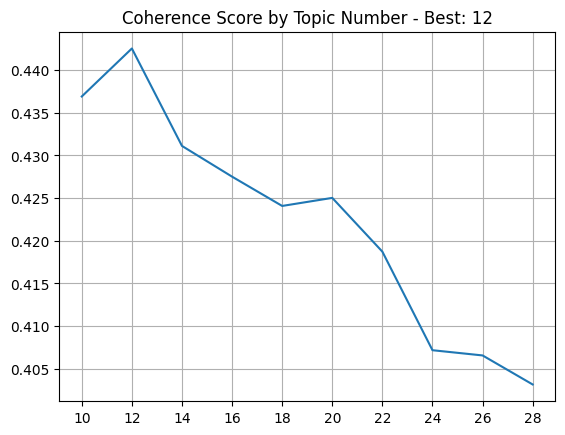

In [50]:
plt.plot(topic_nums, coherence_scores.values())
plt.title("Coherence Score by Topic Number - Best: {}".format(best_num_topics))
plt.grid(True)
plt.xticks(topic_nums)
plt.show()

In [51]:
# manually selected had residual of 0.937
np.mean(do_residual(tfidf, nmf_models[12][0], nmf_models[12][1]))

0.9321531516788397

The model chosen by hyperparameter optimization on coherence would have 12 parameters. This has very similar residual as the manual model with 10 parameters.

### BERTopic

We implement bert using the implementation by Maarten Grootendorst. We restrict the number of topics to 10 to be able to digest them and compare better with NMF.

Uncomment the below to train BERTopic, otherwise load later on.

In [53]:
newsgroup_df = newsgroup_df.reset_index().drop(columns="index")

In [54]:
# Pre-calculate embeddings
data = newsgroup_df["processed_documents"]

embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(data, show_progress_bar=True)

Batches:   0%|          | 0/184 [00:00<?, ?it/s]

In [55]:
#method for dimensionality reduction
umap_model = UMAP.UMAP(#n_neighbors=50,
                  #min_dist=0.5,
                  #metric='cosine',
                  random_state=35)

In [56]:
#higherarchial clustering method
hdbscan_model = HDBSCAN(min_cluster_size=50,
                        #min_samples=30
                       )

In [57]:
#vectorizer to create matrix from corpus
vectorizer_model = TfidfVectorizer(min_df=1, max_df=0.95, max_features=1000)

In [58]:
topic_model = BERTopic(

  # Pipeline models|
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,

  # Hyperparameters
  top_n_words = 10,
  verbose=True
)

# Train model
topics, probs = topic_model.fit_transform(data, embeddings)

2024-12-03 20:59:57,612 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-12-03 21:00:25,410 - BERTopic - Dimensionality - Completed ✓
2024-12-03 21:00:25,411 - BERTopic - Cluster - Start clustering the reduced embeddings
2024-12-03 21:00:25,528 - BERTopic - Cluster - Completed ✓
2024-12-03 21:00:25,533 - BERTopic - Representation - Extracting topics from clusters using representation models.
2024-12-03 21:00:26,247 - BERTopic - Representation - Completed ✓


In [80]:
pd.set_option('display.max_colwidth', None) 
topic_model.get_topic_info()["Representation"][1:11]

1           [encryption, gun, clipper, firearm, escrow, chip, privacy, government, nsa, crypto]
2                       [bike, dod, motorcycle, bmw, rider, ride, behanna, helmet, riding, nec]
3                   [nhl, hockey, team, playoff, player, season, puck, espn, lemieux, islander]
4          [jesus, bible, church, christ, faith, sin, christianity, scripture, athos, catholic]
5                       [geb, pitt, msg, dyer, patient, disease, food, candida, gordon, health]
6                   [sale, shipping, printer, disk, manual, forsale, floppy, ohio, item, brand]
7              [nasa, orbit, launch, satellite, spacecraft, shuttle, moon, mission, jpl, lunar]
8                      [image, jpeg, polygon, format, gif, vga, algorithm, pixel, window, mode]
9                 [israeli, israel, arab, jew, lebanese, palestinian, cpr, gaza, bony, hernlem]
10    [armenian, turkish, armenia, turk, azerbaijani, azerbaijan, turkey, argic, azeri, serdar]
Name: Representation, dtype: object

Our topics appear to appropriately represent our 10 topics.

Topic 1 seems to include both "sci.crypt" and "talk.politics.guns" with consistent top words for both themes.

Topic 2 can be mapped to "rec.motorcycles" with mostly consistent top words (dod, behanna, nec appear irrelevant).

Topic 3 can be mapped to "rec.sport.hockey" with fairly consistent top words (lemieux, islander are irrelevant).

Topic 4 can be mapped to "soc.religion.christian" with consistent top words.

Topic 5 can be mapped to "sci.med" with some unconsistent terms (msg, food).

Topic 6 can be mapped to "misc.forsale" with some irrelevant terms (floppy, ohio).

Topic 7 can be mapped to "sci.space" with consistent top words.

Topic 8 can be mapped to "comp.graphics" but not in an intuitive way but with consistent top words.

Topic 9 can be mapped to "talk.politics.mideast" with consistent top words, although topic 10 could also be mapped to "talk.politics.mideast" with consistent top words. Our algorithm chose to separate the "talk.politics.mideast" theme into two sub themes.

Overall, our model was able to detect most of the 10 overall topics, with some difficulties for the gun, cryptograhy, and mideast. There was less consistency in the top words compared to NMF. It was able to detect 8 out of 10 themes; gun and crypto were grouped and mideast was split into two, similar to NMF.

#### Bertopic Evaluation - Manual "Expert" Evaluation

In [83]:
# Show topics
pd.set_option('display.max_colwidth', 100) 
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,381,-1_ftp_keyboard_henry_data,"[ftp, keyboard, henry, data, pub, image, nasa, toronto, package, object]",[dan wallach dwallach berkeley faq typing injury software monitoring tool monthly posting supers...
1,0,1132,0_encryption_gun_clipper_firearm,"[encryption, gun, clipper, firearm, escrow, chip, privacy, government, nsa, crypto]",[pat rwing uucp pat myrto new clipper chip proposal guv keywords encryption privacy individual r...
2,1,610,1_bike_dod_motorcycle_bmw,"[bike, dod, motorcycle, bmw, rider, ride, behanna, helmet, riding, nec]",[blgardne javelin sim dance bikers faq dod summary wanted know dod afraid ask keywords dod faq j...
3,2,605,2_nhl_hockey_team_playoff,"[nhl, hockey, team, playoff, player, season, puck, espn, lemieux, islander]",[dchhabra stpl ists deepak chhabra vlad playoff pick posting host stpl ists organization solar t...
4,3,579,3_jesus_bible_church_christ,"[jesus, bible, church, christ, faith, sin, christianity, scripture, athos, catholic]",[sun gerry palo uunet net gerry palo christianity repeated life line athos rutgers jek nih gov w...
5,4,573,4_geb_pitt_msg_dyer,"[geb, pitt, msg, dyer, patient, disease, food, candida, gordon, health]",[noring netcom jon noring great post candida yeast bloom long summary warning lot word typical p...
6,5,543,5_sale_shipping_printer_disk,"[sale, shipping, printer, disk, manual, forsale, floppy, ohio, item, brand]",[akachhy cbnewsl att avinash kachhy excel sdk sale organization self distribution usa line follo...
7,6,476,6_nasa_orbit_launch_satellite,"[nasa, orbit, launch, satellite, spacecraft, shuttle, moon, mission, jpl, lunar]",[bradfrd ncar ucar mark bradford astro space frequently seen acronym supersedes space acronym gz...
8,7,454,7_image_jpeg_polygon_format,"[image, jpeg, polygon, format, gif, vga, algorithm, pixel, window, mode]",[lehtori tut kouhia juhana problem organization tampere technology line distribution world posti...
9,8,341,8_israeli_israel_arab_jew,"[israeli, israel, arab, jew, lebanese, palestinian, cpr, gaza, bony, hernlem]",[hasan mcrcim mcgill israeli murdered march originator hasan fangorn mcrcim mcgill posting host ...


Most of the topics capture ideas that we know were contained within the original datset, but some like "gebb_pit_msg" don't particularly match topics we'd imagine from the set. If we dive deeper into the representation, its likely that this topic is capturing medical information with the words "disease" and "patient".

#### Bertopic Evaluation - Visualization

In [100]:
topic_model.get_topic(3)

[('jesus', 0.10805412867126014),
 ('bible', 0.09784344587192144),
 ('church', 0.08601730732055754),
 ('christ', 0.08597196367902807),
 ('faith', 0.08152600595230876),
 ('sin', 0.0735187760573439),
 ('christianity', 0.07312307692997244),
 ('scripture', 0.06776773263826545),
 ('athos', 0.0642677847055579),
 ('catholic', 0.06275059428494431)]

Topic 1


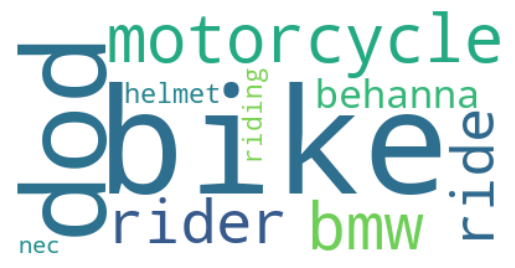

Topic 2


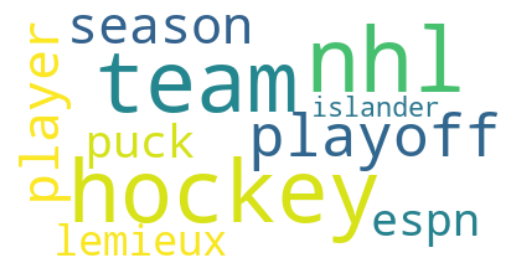

Topic 3


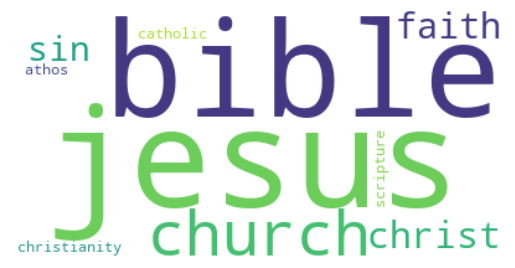

Topic 4


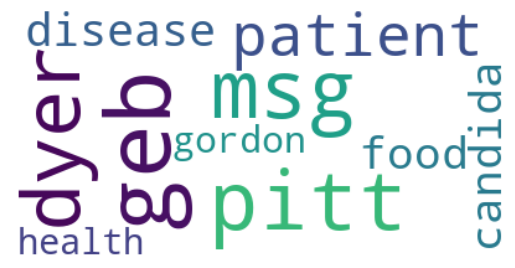

Topic 5


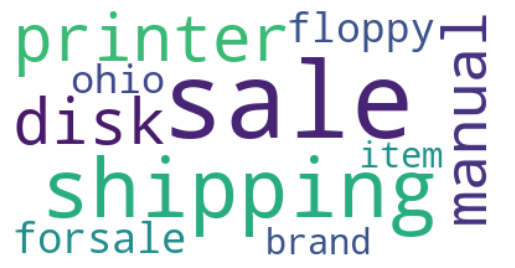

Topic 6


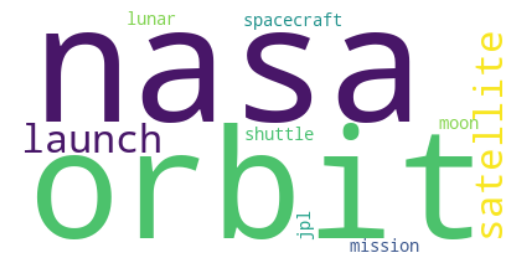

Topic 7


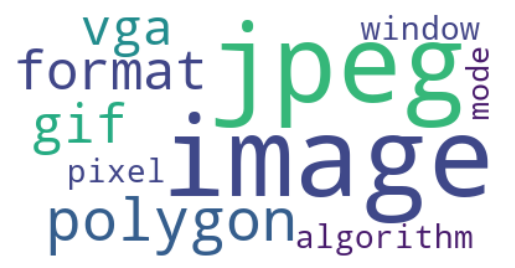

Topic 8


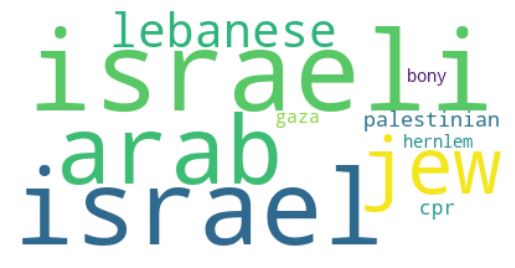

Topic 9


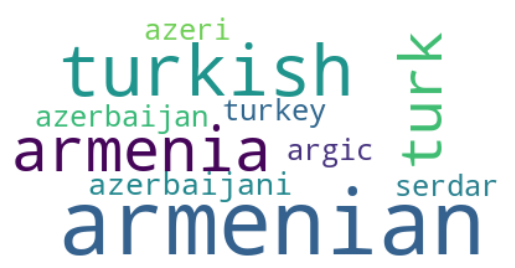

In [105]:
def create_wordcloud(topic_model, topic):
    text = {word: value for word, value in topic_model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show word cloud
for i in range(1,10):
    print(f"Topic {i}")
    create_wordcloud(topic_model, topic=i)

In [84]:
#setting for below visualization
pio.renderers.default = "notebook"

In [85]:
data = newsgroup_df["processed_documents"]
classes = list(newsgroup_df["newsgroup"])
topics_per_class = topic_model.topics_per_class(data, classes=classes)

10it [00:01,  9.38it/s]


In [87]:
fig2 = topic_model.visualize_topics_per_class(topics_per_class, top_n_topics=10)
fig2.write_html("interactive_plot_bert.html", include_plotlyjs="cdn")
fig2.show()

This interactive chart shows the original distributions of labels for documents assigned to each BERTopic generated topic. For example, the gun-related topic contains mostly documents from the gun and science category.

We can see that most of the documents that had topic 1 as the dominant topic (encryption, gun, clipper, firearm, escrow, chip, privacy, government, nsa, crypto) were from the talk.politics.guns and sci.crypt newsgroup.

Most of the documents that had topic 2 as the dominant topic (bike, dod, motorcycle, bmw, rider, ride, behanna, helmet, riding, nec) were from rec.motorcycles with some from misc.forsale.

Most of the documents that had topic 3 as the dominant topic (nhl, hockey, team, playoff, player, season, puck, espn, lemieux, islander) were mostly from comp.graphics and rec.sport.hockey.

Most of the documents that had topic 4 as the dominant topic (jesus, bible, church, christ, faith, sin, christianity, scripture, athos, catholic) were from soc.religion.christian.

Most of the documents that had topic 5 as the dominant topic (geb, pitt, msg, dyer, patient, disease, food, candida, gordon, health) were from sci.med.

Most of the documents that had topic 6 as the dominant topic (sale, shipping, printer, disk, manual, forsale, floppy, ohio, item, brand) were from misc.forsale, with some from comp.graphics.

Most of the documents that had topic 7 as the dominant topic (nasa, orbit, launch, satellite, spacecraft, shuttle, moon, mission, jpl, lunar) were from sci.space.

Most of the documents that had topic 8 as the dominant topic (image, jpeg, polygon, format, gif, vga, algorithm, pixel, window, mode) were from comp.graphics.

Most of the documents that had topic 9 as the dominant topic (israeli, israel, arab, jew, lebanese, palestinian, cpr, gaza, bony, hernlem) were from talk.politics.mideast but only 350 of the 550.

Most of the documents that had topic 10 as the dominant topic (armenian, turkish, armenia, turk, azerbaijani, azerbaijan, turkey, argic, azeri, serdar) were from talk.politics.mideast but only 150 of the 550.

Except for topics 9 and 10 all of the other topics were able to get the full scope of the 500 documents in each newsgroup, with topic having over 500.

In [88]:
topic_model.visualize_documents(data, embeddings=embeddings)

This visualization makes it clear that each of the topics are distinct across the original documents, with minimal overlap. It's reassuring that the middle-east related topics are close to each other in the reduced space.

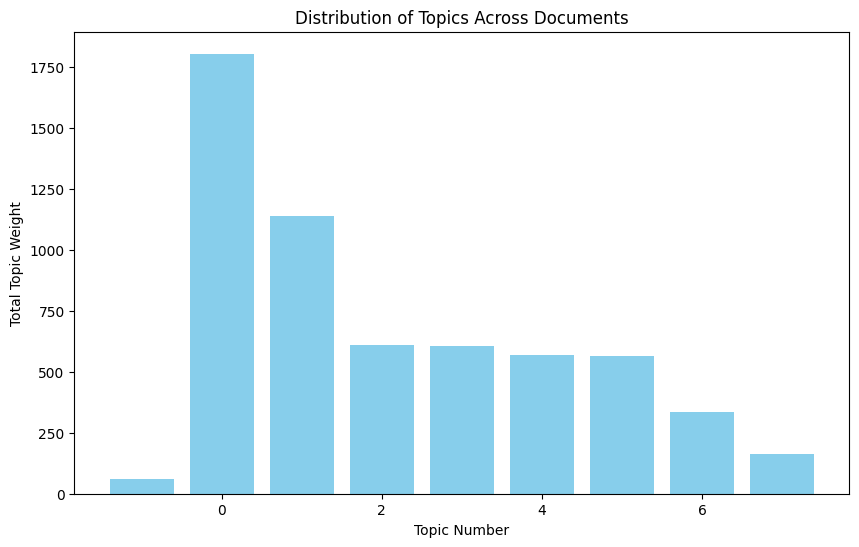

Topic
-1         -1_rider_ufl_cunixb_freedom
 0      0_image_nasa_graphic_satellite
 1    1_encryption_gun_clipper_firearm
 2           2_bike_dod_bmw_motorcycle
 3           3_hockey_nhl_team_playoff
 4              4_geb_pitt_msg_disease
 5         5_jesus_church_bible_christ
 6           6_israeli_israel_arab_jew
 7     7_armenian_turkish_armenia_turk
Name: Name, dtype: object


In [53]:
topic_frequencies = [topic_model.get_topic_freq(i) for i in topic_model.get_topic_info()['Topic'].values][0]

# Plot the distribution
plt.figure(figsize=(10, 6))
plt.bar(topic_frequencies['Topic'], topic_frequencies['Count'], color='skyblue')
plt.xlabel('Topic Number')
plt.ylabel('Total Topic Weight')
plt.title('Distribution of Topics Across Documents')
plt.show()
print(topic_model.get_topic_info().set_index('Topic')['Name'])

Some topics here are underrepresented in the original documents. Topic -1 corresponds to only aorund 50 documents, while Topic 0 may be overrepresentative of science-related documents. While this doesn't discount the topics, it's important to note that some cover more ground than others.

In [89]:
topic_model.visualize_topics()

#### BERTopic Evaluation - Predictive Utility

As seen in the previous visualizations, the topics generated by BERTopic don't map back nicely to the original categories. Therefore we can't use how well the model captured the original categories as a sanity check in this case.

#### BERTopic Evaluation - Coherence

In [ ]:
def do_coherence_bertopic(bertopic_topics, terms=feature_names):
    """Generates a final coherence score for a NMF model"""
    # where k is number of topics

    # Get all of the topic descriptors - the term_rankings, based on top 10 terms
    term_rankings = bertopic_topics
    curr_coherence = calculate_coherence( w2v_model, term_rankings )
    print("K=%02d: Coherence=%.4f" % ( len(term_rankings), curr_coherence ) )
    return curr_coherence

In [ ]:
#extract the topics from the trained model
bertopic_topics = np.array(list(topic_model.topic_representations_.values()))[:,:,0]

In [ ]:
# Coherence Score
do_coherence_bertopic(bertopic_topics)

K=09: Coherence=0.5075


0.5075420030013279

#### BERTopic Evaluation - Diversity

In [ ]:
# Topic Diversity
temp_df = dict()
temp_df['topics'] = bertopic_topics
metric.score(temp_df)

0.9888888888888889

### Comparison - NMF and BERTopic

| Measure              | NMF | BERTopic |
| :---------------- | :------: | :----: |
| Coherence        |   0.43   | 0.51 |
| Diversity           |   0.98   | 0.99 |

Overall, our models seem to be performing very similarily. Bertopic seems to cluster the groups better, whereas the NMF model had more consistent top words across themes. Both models incorrectly split the mideast group into two themes and both models grouped two themes into one (gun and crypto for bert and graphics and sale for NMF). Based on the distribution of the newsgroup documents within each theme and the coherence score, we believe the Bertopic was able to extract themes better than the NMF.